## Trigger Word Detection

Welcome to the final programming assignment of this specialization! 

In this week's videos, you learned about applying deep learning to speech recognition. In this assignment, you will construct a speech dataset and implement an algorithm for trigger word detection (sometimes also called keyword detection, or wakeword detection). Trigger word detection is the technology that allows devices like Amazon Alexa, Google Home, Apple Siri, and Baidu DuerOS to wake up upon hearing a certain word.  

For this exercise, our trigger word will be "Activate." Every time it hears you say "activate," it will make a "chiming" sound. By the end of this assignment, you will be able to record a clip of yourself talking, and have the algorithm trigger a chime when it detects you saying "activate." 

After completing this assignment, perhaps you can also extend it to run on your laptop so that every time you say "activate" it starts up your favorite app, or turns on a network connected lamp in your house, or triggers some other event? 

<img src="images/sound.png" style="width:1000px;height:150px;">

In this assignment you will learn to: 
- Structure a speech recognition project
- Synthesize and process audio recordings to create train/dev datasets
- Train a trigger word detection model and make predictions

Lets get started! Run the following cell to load the package you are going to use.    


In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *

import pickle
import wave
%matplotlib inline

# 1 - Data synthesis: Creating a speech dataset 

Let's start by building a dataset for your trigger word detection algorithm. A speech dataset should ideally be as close as possible to the application you will want to run it on. In this case, you'd like to detect the word "activate" in working environments (library, home, offices, open-spaces ...). You thus need to create recordings with a mix of positive words ("activate") and negative words (random words other than activate) on different background sounds. Let's see how you can create such a dataset. 

## 1.1 - Listening to the data   

One of your friends is helping you out on this project, and they've gone to libraries, cafes, restaurants, homes and offices all around the region to record background noises, as well as snippets of audio of people saying positive/negative words. This dataset includes people speaking in a variety of accents. 

In the raw_data directory, you can find a subset of the raw audio files of the positive words, negative words, and background noise. You will use these audio files to synthesize a dataset to train the model. The "activate" directory contains positive examples of people saying the word "activate". The "negatives" directory contains negative examples of people saying random words other than "activate". There is one word per audio recording. The "backgrounds" directory contains 10 second clips of background noise in different environments.

Run the cells below to listen to some examples.

In [3]:
IPython.display.Audio("./train/audio/cat/b00dff7e_nohash_0.wav")

In [8]:
IPython.display.Audio("train/audio/_background_noise_/doing_the_dishes.wav")

You will use these three type of recordings (positives/negatives/backgrounds) to create a labelled dataset.

## 1.2 - From audio recordings to spectrograms

What really is an audio recording? A microphone records little variations in air pressure over time, and it is these little variations in air pressure that your ear also perceives as sound. You can think of an audio recording is a long list of numbers measuring the little air pressure changes detected by the microphone. We will use audio sampled at 44100 Hz (or 44100 Hertz). This means the microphone gives us 44100 numbers per second. Thus, a 10 second audio clip is represented by 441000 numbers (= $10 \times 44100$). 

It is quite difficult to figure out from this "raw" representation of audio whether the word "activate" was said. In  order to help your sequence model more easily learn to detect triggerwords, we will compute a *spectrogram* of the audio. The spectrogram tells us how much different frequencies are present in an audio clip at a moment in time. 

(If you've ever taken an advanced class on signal processing or on Fourier transforms, a spectrogram is computed by sliding a window over the raw audio signal, and calculates the most active frequencies in each window using a Fourier transform. If you don't understand the previous sentence, don't worry about it.) 

Lets see an example. 

In [7]:
IPython.display.Audio("./train/audio/cat/b00dff7e_nohash_0.wav")

In [6]:
IPython.display.Audio("train2.wav")

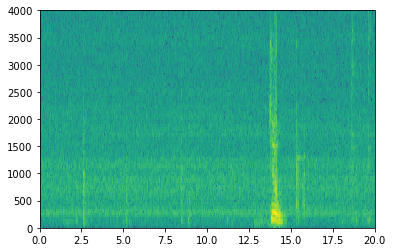

In [2]:
x = graph_spectrogram("train2.wav")

[-0.02419053 -0.01385673 -0.03555772 ...,  0.02713404 -0.01764579
 -0.04106909]


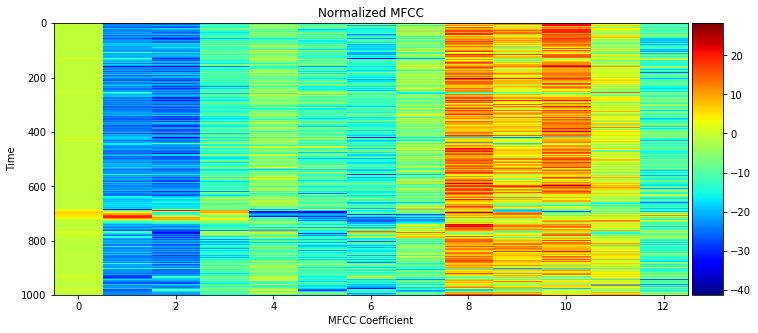

In [7]:
x = plot_mfcc_feature_from_file("train2.wav")

The graph above represents how active each frequency is (y axis) over a number of time-steps (x axis). 

<img src="images/spectrogram.png" style="width:500px;height:200px;">
<center> **Figure 1**: Spectrogram of an audio recording, where the color shows the degree to which different frequencies are present (loud) in the audio at different points in time. Green squares means a certain frequency is more active or more present in the audio clip (louder); blue squares denote less active frequencies. </center>

The dimension of the output spectrogram depends upon the hyperparameters of the spectrogram software and the length of the input. In this notebook, we will be working with 10 second audio clips as the "standard length" for our training examples. The number of timesteps of the spectrogram will be 5511. You'll see later that the spectrogram will be the input $x$ into the network, and so $T_x = 5511$.


In [6]:
_, data = wavfile.read("train2.wav")
print(data)
print("Time steps in audio recording before spectrogram", data.shape)
print("Time steps in input after spectrogram", x.shape)

[ -68  -38 -101 ...,   81  -49 -117]
Time steps in audio recording before spectrogram (160000,)
Time steps in input after spectrogram (101, 1998)


Now, you can define:

In [2]:
Tx = 1998 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

Note that even with 10 seconds being our default training example length, 10 seconds of time can be discretized to different numbers of value. You've seen 441000 (raw audio) and 5511 (spectrogram). In the former case, each step represents $10/441000 \approx 0.000023$ seconds. In the second case, each step represents $10/5511 \approx 0.0018$ seconds. 

For the 10sec of audio, the key values you will see in this assignment are:

- $441000$ (raw audio)
- $5511 = T_x$ (spectrogram output, and dimension of input to the neural network). 
- $10000$ (used by the `pydub` module to synthesize audio) 
- $1375 = T_y$ (the number of steps in the output of the GRU you'll build). 

Note that each of these representations correspond to exactly 10 seconds of time. It's just that they are discretizing them to different degrees. All of these are hyperparameters and can be changed (except the 441000, which is a function of the microphone). We have chosen values that are within the standard ranges uses for speech systems. 

Consider the $T_y = 1375$ number above. This means that for the output of the model, we discretize the 10s into 1375 time-intervals (each one of length $10/1375 \approx 0.0072$s) and try to predict for each of these intervals whether someone recently finished saying "activate." 

Consider also the 10000 number above. This corresponds to discretizing the 10sec clip into 10/10000 = 0.001 second itervals. 0.001 seconds is also called 1 millisecond, or 1ms. So when we say we are discretizing according to 1ms intervals, it means we are using 10,000 steps. 


In [3]:
Ty = 1998 # The number of time steps in the output of our model

## 1.3 - Generating a single training example

Because speech data is hard to acquire and label, you will synthesize your training data using the audio clips of activates, negatives, and backgrounds. It is quite slow to record lots of 10 second audio clips with random "activates" in it. Instead, it is easier to record lots of positives and negative words, and record background noise separately (or download background noise from free online sources). 

To synthesize a single training example, you will:

- Pick a random 10 second background audio clip
- Randomly insert 0-4 audio clips of "activate" into this 10sec clip
- Randomly insert 0-2 audio clips of negative words into this 10sec clip

Because you had synthesized the word "activate" into the background clip, you know exactly when in the 10sec clip the "activate" makes its appearance. You'll see later that this makes it easier to generate the labels $y^{\langle t \rangle}$ as well. 

You will use the pydub package to manipulate audio. Pydub converts raw audio files into lists of Pydub data structures (it is not important to know the details here). Pydub uses 1ms as the discretization interval (1ms is 1 millisecond = 1/1000 seconds) which is why a 10sec clip is always represented using 10,000 steps. 

In [2]:
# Load audio segments using pydub 
keywords, backgrounds = load_raw_audio()

print("background len: " + str(len(backgrounds[0])))    # Should be 10,000, since it is a 10 sec clip
print("number of keyword: " + str(len(keywords.keys())))
print("keywords[0] len: " + str(len(keywords['on'][0])))     # Maybe around 1000, since an "activate" audio clip is usually around 1 sec (but varies a lot)
print("keywords[1] len: " + str(len(keywords['off'][0])))     # Different "activate" clips can have different lengths 

background len: 2
number of keyword: 30
keywords[0] len: 2
keywords[1] len: 2


**Overlaying positive/negative words on the background**:

Given a 10sec background clip and a short audio clip (positive or negative word), you need to be able to "add" or "insert" the word's short audio clip onto the background. To ensure audio segments inserted onto the background do not overlap, you will keep track of the times of previously inserted audio clips. You will be inserting multiple clips of positive/negative words onto the background, and you don't want to insert an "activate" or a random word somewhere that overlaps with another clip you had previously added. 

For clarity, when you insert a 1sec "activate" onto a 10sec clip of cafe noise, you end up with a 10sec clip that sounds like someone sayng "activate" in a cafe, with "activate" superimposed on the background cafe noise. You do *not* end up with an 11 sec clip. You'll see later how pydub allows you to do this. 

**Creating the labels at the same time you overlay**:

Recall also that the labels $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate." Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activates." 

When you insert or overlay an "activate" clip, you will also update labels for $y^{\langle t \rangle}$, so that 50 steps of the output now have target label 1. You will train a GRU to detect when someone has *finished* saying "activate". For example, suppose the synthesized "activate" clip ends at the 5sec mark in the 10sec audio---exactly halfway into the clip. Recall that $T_y = 1375$, so timestep $687 = $ `int(1375*0.5)` corresponds to the moment at 5sec into the audio. So, you will set $y^{\langle 688 \rangle} = 1$. Further, you would quite satisfied if the GRU detects "activate" anywhere within a short time-internal after this moment, so we actually set 50 consecutive values of the label $y^{\langle t \rangle}$ to 1. Specifically, we have $y^{\langle 688 \rangle} = y^{\langle 689 \rangle} = \cdots = y^{\langle 737 \rangle} = 1$.  

This is another reason for synthesizing the training data: It's relatively straightforward to generate these labels $y^{\langle t \rangle}$ as described above. In contrast, if you have 10sec of audio recorded on a microphone, it's quite time consuming for a person to listen to it and mark manually exactly when "activate" finished. 

Here's a figure illustrating the labels $y^{\langle t \rangle}$, for a clip which we have inserted "activate", "innocent", activate", "baby." Note that the positive labels "1" are associated only with the positive words. 

<img src="images/label_diagram.png" style="width:500px;height:200px;">
<center> **Figure 2** </center>

To implement the training set synthesis process, you will use the following helper functions. All of these function will use a 1ms discretization interval, so the 10sec of audio is alwsys discretized into 10,000 steps. 

1. `get_random_time_segment(segment_ms)` gets a random time segment in our background audio
2. `is_overlapping(segment_time, existing_segments)` checks if a time segment overlaps with existing segments
3. `insert_audio_clip(background, audio_clip, existing_times)` inserts an audio segment at a random time in our background audio using `get_random_time_segment` and `is_overlapping`
4. `insert_ones(y, segment_end_ms)` inserts 1's into our label vector y after the word "activate"

The function `get_random_time_segment(segment_ms)` returns a random time segment onto which we can insert an audio clip of duration `segment_ms`. Read through the code to make sure you understand what it is doing. 


In [6]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """

    segment_start = np.random.randint(low=0, high=10000-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [6]:
def get_random_time_segment_bg(background):
    """
    Gets background file positions
    
    Arguments:
    background -- background AudioSegment
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    bg_duration = len(background)
    segment_start = np.random.randint(low=0, high=bg_duration - 10000)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + 10000
    
    return (segment_start, segment_end)

Next, suppose you have inserted audio clips at segments (1000,1800) and (3400,4500). I.e., the first segment starts at step 1000, and ends at step 1800. Now, if we are considering inserting a new audio clip at (3000,3600) does this overlap with one of the previously inserted segments? In this case, (3000,3600) and (3400,4500) overlap, so we should decide against inserting a clip here. 

For the purpose of this function, define (100,200) and (200,250) to be overlapping, since they overlap at timestep 200. However, (100,199) and (200,250) are non-overlapping. 

**Exercise**: Implement `is_overlapping(segment_time, existing_segments)` to check if a new time segment overlaps with any of the previous segments. You will need to carry out 2 steps:

1. Create a "False" flag, that you will later set to "True" if you find that there is an overlap.
2. Loop over the previous_segments' start and end times. Compare these times to the segment's start and end times. If there is an overlap, set the flag defined in (1) as True. You can use:
```python
for ....:
        if ... <= ... and ... >= ...:
            ...
```
Hint: There is overlap if the segment starts before the previous segment ends, and the segment ends after the previous segment starts.

In [7]:
# GRADED FUNCTION: is_overlapping

def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    ### START CODE HERE ### (≈ 4 line)
    # Step 1: Initialize overlap as a "False" flag. (≈ 1 line)
    overlap = False
    
    # Step 2: loop over the previous_segments start and end times.
    # Compare start/end times and set the flag to True if there is an overlap (≈ 3 lines)
    for previous_start, previous_end in previous_segments:
        if previous_start <= segment_start and segment_start <= previous_end or previous_start <= segment_end and segment_end <= previous_end:
            overlap = True
    ### END CODE HERE ###

    return overlap

In [8]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


**Expected Output**:

<table>
    <tr>
        <td>
            **Overlap 1**
        </td>
        <td>
           False
        </td>
    </tr>
    <tr>
        <td>
            **Overlap 2**
        </td>
        <td>
           True
        </td>
    </tr>
</table>

Now, lets use the previous helper functions to insert a new audio clip onto the 10sec background at a random time, but making sure that any newly inserted segment doesn't overlap with the previous segments. 

**Exercise**: Implement `insert_audio_clip()` to overlay an audio clip onto the background 10sec clip. You will need to carry out 4 steps:

1. Get a random time segment of the right duration in ms.
2. Make sure that the time segment does not overlap with any of the previous time segments. If it is overlapping, then go back to step 1 and pick a new time segment.
3. Add the new time segment to the list of existing time segments, so as to keep track of all the segments you've inserted.  
4. Overlay the audio clip over the background using pydub. We have implemented this for you.

In [8]:
# GRADED FUNCTION: insert_audio_clip

def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)

    # Step 1: Use one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip. (≈ 1 line)
    segment_time = get_random_time_segment(segment_ms)
    
    # Step 2: Check if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap. (≈ 2 lines)
    while is_overlapping(segment_time, previous_segments):
        segment_time = get_random_time_segment(segment_ms)

    # Step 3: Add the new segment_time to the list of previous_segments (≈ 1 line)
    previous_segments.append(segment_time)

    # Step 4: Superpose audio segment and background
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time

In [10]:
np.random.seed(5)

# extract background
background = backgrounds[1]-15.0
bg_segment = get_random_time_segment_bg(background)
cliped_background = background[bg_segment[0]:bg_segment[1]]

audio_clip, segment_time = insert_audio_clip(cliped_background, keywords['on'][1]+10.0, [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (2254, 2808)


In [12]:
keywords['on'][0].export("on.wav", format="wav")
IPython.display.Audio("on.wav")

**Expected Output**

<table>
    <tr>
        <td>
            **Segment Time**
        </td>
        <td>
           (2254, 3169)
        </td>
    </tr>
</table>

In [63]:
# Expected audio
IPython.display.Audio("on.wav")

Finally, implement code to update the labels $y^{\langle t \rangle}$, assuming you just inserted an "activate." In the code below, `y` is a `(1,1375)` dimensional vector, since $T_y = 1375$. 

If the "activate" ended at time step $t$, then set $y^{\langle t+1 \rangle} = 1$ as well as for up to 49 additional consecutive values. However, make sure you don't run off the end of the array and try to update `y[0][1375]`, since the valid indices are `y[0][0]` through `y[0][1374]` because $T_y = 1375$. So if "activate" ends at step 1370, you would get only `y[0][1371] = y[0][1372] = y[0][1373] = y[0][1374] = 1`

**Exercise**: Implement `insert_ones()`. You can use a for loop. (If you are an expert in python's slice operations, feel free also to use slicing to vectorize this.) If a segment ends at `segment_end_ms` (using a 10000 step discretization), to convert it to the indexing for the outputs $y$ (using a $1375$ step discretization), we will use this formula:  
```
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
```

In [9]:
# GRADED FUNCTION: insert_ones

def insert_ones(y, segment_end_ms, value):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 following labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    value -- word's id
    
    Returns:
    y -- updated labels
    """
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)

    # Add 1 to the correct index in the background label (y)
    ### START CODE HERE ### (≈ 3 lines)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = value
    ### END CODE HERE ###
    
    return y

sanity checks: 0.0 1.0 0.0


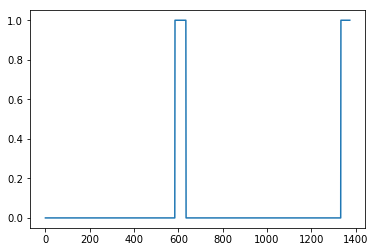

In [15]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700, 1)
plt.plot(insert_ones(arr1, 4251, 1)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

**Expected Output**
<table>
    <tr>
        <td>
            **sanity checks**:
        </td>
        <td>
           0.0 1.0 0.0
        </td>
    </tr>
</table>
<img src="images/ones_reference.png" style="width:320;height:240px;">

Finally, you can use `insert_audio_clip` and `insert_ones` to create a new training example.

**Exercise**: Implement `create_training_example()`. You will need to carry out the following steps:

1. Initialize the label vector $y$ as a numpy array of zeros and shape $(1, T_y)$.
2. Initialize the set of existing segments to an empty list.
3. Randomly select 0 to 4 "activate" audio clips, and insert them onto the 10sec clip. Also insert labels at the correct position in the label vector $y$.
4. Randomly select 0 to 2 negative audio clips, and insert them into the 10sec clip. 


In [25]:
def create_training_sample(background, keywords, filename):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    keywords -- a list of audio segments of each word
    
    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    # Make background quieter
    tmp_background = background - 25

    ### START CODE HERE ###
    # Step 1: Initialize y (label vector) of zeros (≈ 1 line)
    y = np.zeros((1, Ty, len(KEYWORDS)+1))

    # Step 2: Initialize segment times as empty list (≈ 1 line)
    previous_segments = []
    ### END CODE HERE ###
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_keywords = np.random.randint(0, 5)

    random_keyword_indices = np.random.randint(len(keywords), size=number_of_keywords)
    random_keywords = [(i, keywords[list(keywords.keys())[i]]) for i in random_keyword_indices]

    ### START CODE HERE ### (≈ 3 lines)
    # Step 3: Loop over randomly selected "activate" clips and insert in background
    for idx, random_keyword_list in random_keywords:
        #print(f"idx:{idx}")
        random_index = np.random.randint(len(random_keyword_list))
        random_keyword = random_keyword_list[random_index]

        # Insert the audio clip on the background
        tmp_background, segment_time = insert_audio_clip(tmp_background, random_keyword, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y" with increment
        keyword = list(keywords.keys())[i]
        y = insert_ones(y, segment_end, get_hot_encoded(keyword))
    ### END CODE HERE ###
    
    # Standardize the volume of the audio clip 
    tmp_background = match_target_amplitude(tmp_background, -20.0)

    # Export new training example 
    file_handle = background.export("train.wav", format="wav")
    #print(f"File ({filename}) was saved in your directory.")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = create_spectrogram("train.wav")
    
    return x, y

In [53]:
# Set the random seed
np.random.seed(19)
# extract background
background = match_target_amplitude(backgrounds[4], -25.0)
bg_segment = get_random_time_segment_bg(background)
cliped_background = background[bg_segment[0]:bg_segment[1]]

x, y = create_training_sample(cliped_background, keywords, 'train.wav')

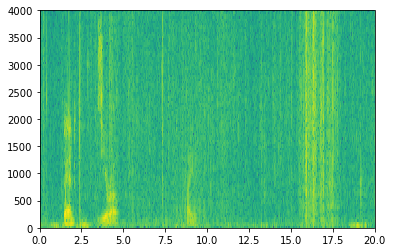

In [54]:
ret = graph_spectrogram('train.wav')
IPython.display.Audio('train.wav')

In [18]:
from td_utils import *

In [4]:
# Set the random seed
np.random.seed(18)
for i in range(0, 1):
    start = i * 1000
    end = (i+1) * 1000
    create_dataset(f"train_dataset{start:05d}_{end:05d}.pickle", backgrounds, keywords, 3)

creating train_dataset00000_01000.pickle.
originshape:(3, 999, 13) flattenshape:(2997, 13)
[[  6.15546619e-01  -8.65571726e-01  -8.89773726e-01  -1.61087207e+00
   -2.56325899e-01  -8.31870502e-01  -1.80209912e+00  -1.25237808e+00
   -1.28244068e+00  -1.46717433e+00   1.04072812e+00   5.32178871e-01
   -2.47232923e-02]
 [  5.99642510e-01  -5.61948688e-01   4.61150360e-01  -1.23010692e-01
    4.05888964e-01   1.64591749e-01  -6.37660741e-01  -2.83405871e-01
    9.99940329e-01   5.38584107e-01  -5.17009579e-01  -6.00243796e-01
   -3.38341455e-01]
 [  6.00051065e-01  -8.61082402e-01  -4.20686221e-01  -1.42779334e-01
   -9.20731932e-01  -1.64682327e+00  -1.54776055e+00  -8.11639906e-02
    1.02366248e+00   9.12172005e-01  -5.54129549e-02   1.00401942e+00
    1.46195471e+00]
 [  6.17588011e-01  -7.65153769e-01  -3.62298997e-01  -6.81319432e-01
   -1.78734193e+00  -1.44466733e+00  -2.11046824e+00  -6.22466421e-01
   -6.05725362e-01  -3.21717763e-01  -8.59014870e-01   6.59006430e-01
    1.542

In [7]:
# Set the random seed
np.random.seed(18)
for i in range(0, 10):
    start = i * 1000
    end = (i+1) * 1000
    create_dataset(f"train_dataset{start:05d}_{end:05d}.pickle", backgrounds, keywords, 1000)

creating train_dataset00000_01000.pickle
creating train_dataset01000_02000.pickle
creating train_dataset02000_03000.pickle
creating train_dataset03000_04000.pickle
creating train_dataset04000_05000.pickle
creating train_dataset05000_06000.pickle
creating train_dataset06000_07000.pickle
creating train_dataset07000_08000.pickle
creating train_dataset08000_09000.pickle
creating train_dataset09000_10000.pickle


**Expected Output**
<img src="images/train_reference.png" style="width:320;height:240px;">

Now you can listen to the training example you created and compare it to the spectrogram generated above.

In [112]:
IPython.display.Audio("train.wav")

**Expected Output**

In [56]:
IPython.display.Audio("audio_examples/train_reference.wav")

Finally, you can plot the associated labels for the generated training example.

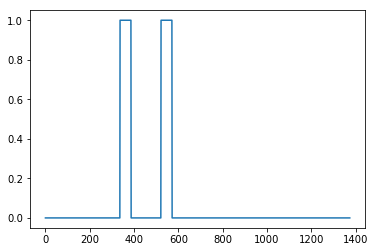

In [39]:
plt.plot(y[0])

**Expected Output**
<img src="images/train_label.png" style="width:320;height:240px;">

## 1.4 - Full training set

You've now implemented the code needed to generate a single training example. We used this process to generate a large training set. To save time, we've already generated a set of training examples. 

In [114]:
# Load preprocessed training examples
X = np.load("./Triggerworddetection/XY_train/X.npy")
Y = np.load("./Triggerworddetection/XY_train/Y.npy")

## 1.5 - Development set

To test our model, we recorded a development set of 25 examples. While our training data is synthesized, we want to create a development set using the same distribution as the real inputs. Thus, we recorded 25 10-second audio clips of people saying "activate" and other random words, and labeled them by hand. This follows the principle described in Course 3 that we should create the dev set to be as similar as possible to the test set distribution; that's why our dev set uses real rather than synthesized audio. 


In [119]:
# Load preprocessed dev set examples
X_dev = np.load("./Triggerworddetection/XY_dev/X_dev.npy")
Y_dev = np.load("./Triggerworddetection/XY_dev/Y_dev.npy")

# 2 - Model

Now that you've built a dataset, lets write and train a trigger word detection model! 

The model will use 1-D convolutional layers, GRU layers, and dense layers. Let's load the packages that will allow you to use these layers in Keras. This might take a minute to load. 

In [42]:
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from keras.optimizers import Adam

Using TensorFlow backend.


## 2.1 - Build the model

Here is the architecture we will use. Take some time to look over the model and see if it makes sense. 

<img src="images/model.png" style="width:600px;height:600px;">
<center> **Figure 3** </center>

One key step of this model is the 1D convolutional step (near the bottom of Figure 3). It inputs the 5511 step spectrogram, and outputs a 1375 step output, which is then further processed by multiple layers to get the final $T_y = 1375$ step output. This layer plays a role similar to the 2D convolutions you saw in Course 4, of extracting low-level features and then possibly generating an output of a smaller dimension. 

Computationally, the 1-D conv layer also helps speed up the model because now the GRU  has to process only 1375 timesteps rather than 5511 timesteps. The two GRU layers read the sequence of inputs from left to right, then ultimately uses a dense+sigmoid layer to make a prediction for $y^{\langle t \rangle}$. Because $y$ is binary valued (0 or 1), we use a sigmoid output at the last layer to estimate the chance of the output being 1, corresponding to the user having just said "activate."

Note that we use a uni-directional RNN rather than a bi-directional RNN. This is really important for trigger word detection, since we want to be able to detect the trigger word almost immediately after it is said. If we used a bi-directional RNN, we would have to wait for the whole 10sec of audio to be recorded before we could tell if "activate" was said in the first second of the audio clip.  


Implementing the model can be done in four steps:
    
**Step 1**: CONV layer. Use `Conv1D()` to implement this, with 196 filters, 
a filter size of 15 (`kernel_size=15`), and stride of 4. [[See documentation.](https://keras.io/layers/convolutional/#conv1d)]

**Step 2**: First GRU layer. To generate the GRU layer, use:
```
X = GRU(units = 128, return_sequences = True)(X)
```
Setting `return_sequences=True` ensures that all the GRU's hidden states are fed to the next layer. Remember to follow this with Dropout and BatchNorm layers. 

**Step 3**: Second GRU layer. This is similar to the previous GRU layer (remember to use `return_sequences=True`), but has an extra dropout layer. 

**Step 4**: Create a time-distributed dense layer as follows: 
```
X = TimeDistributed(Dense(1, activation = "sigmoid"))(X)
```
This creates a dense layer followed by a sigmoid, so that the parameters used for the dense layer are the same for every time step. [[See documentation](https://keras.io/layers/wrappers/).]

**Exercise**: Implement `model()`, the architecture is presented in Figure 3.

In [45]:
# GRADED FUNCTION: model

def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    ### START CODE HERE ###
    
    # Step 1: CONV layer (≈4 lines)
    X = Conv1D(filters=196, kernel_size=15, strides=4)(X_input)  # CONV1D
    X = BatchNormalization()(X)                                  # Batch normalization
    X = Activation("relu")(X)                                    # ReLu activation
    X = Dropout(0.8)(X)                                          # dropout (use 0.8)

    # Step 2: First GRU Layer (≈4 lines)
    X = GRU(units=128, return_sequences=True)(X)           # GRU (use 128 units and return the sequences)
    X = Dropout(0.8)(X)                                    # dropout (use 0.8)
    X = BatchNormalization()(X)                            # Batch normalization
    
    # Step 3: Second GRU Layer (≈4 lines)
    X = GRU(units=128, return_sequences=True)(X)           # GRU (use 128 units and return the sequences)
    X = Dropout(0.8)(X)                                    # dropout (use 0.8)
    X = BatchNormalization()(X)                            # Batch normalization
    X = Dropout(0.8)(X)                                    # dropout (use 0.8)
    
    # Step 4: Time-distributed dense layer (≈1 line)
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)

    ### END CODE HERE ###

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [46]:
model = model(input_shape = (Tx, n_freq))

Let's print the model summary to keep track of the shapes.

In [47]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_1 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_1 (GRU)                  (None, 1375, 128)         124800    
_________________________________________________________________
dropout_2 (Dropout)          (None, 1375, 128)         0         
__________

**Expected Output**:

<table>
    <tr>
        <td>
            **Total params**
        </td>
        <td>
           522,561
        </td>
    </tr>
    <tr>
        <td>
            **Trainable params**
        </td>
        <td>
           521,657
        </td>
    </tr>
    <tr>
        <td>
            **Non-trainable params**
        </td>
        <td>
           904
        </td>
    </tr>
</table>

The output of the network is of shape (None, 1375, 1) while the input is (None, 5511, 101). The Conv1D has reduced the number of steps from 5511 at spectrogram to 1375. 

## 2.2 - Fit the model

Trigger word detection takes a long time to train. To save time, we've already trained a model for about 3 hours on a GPU using the architecture you built above, and a large training set of about 4000 examples. Let's load the model. 

In [48]:
model = load_model('./models/tr_model.h5')

You can train the model further, using the Adam optimizer and binary cross entropy loss, as follows. This will run quickly because we are training just for one epoch and with a small training set of 26 examples. 

In [49]:
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [50]:
model.fit(X, Y, batch_size = 5, epochs=1)

Epoch 1/1
26/26 [==============================] - 25s - loss: 0.0727 - acc: 0.9806    


## 2.3 - Test the model

Finally, let's see how your model performs on the dev set.

In [51]:
loss, acc = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

25/25 [==============================] - 5s
Dev set accuracy =  0.946036338806


This looks pretty good! However, accuracy isn't a great metric for this task, since the labels are heavily skewed to 0's, so a neural network that just outputs 0's would get slightly over 90% accuracy. We could define more useful metrics such as F1 score or Precision/Recall. But let's not bother with that here, and instead just empirically see how the model does. 

# 3 - Making Predictions

Now that you have built a working model for trigger word detection, let's use it to make predictions. This code snippet runs audio (saved in a wav file) through the network. 

<!--
can use your model to make predictions on new audio clips.

You will first need to compute the predictions for an input audio clip.

**Exercise**: Implement predict_activates(). You will need to do the following:

1. Compute the spectrogram for the audio file
2. Use `np.swap` and `np.expand_dims` to reshape your input to size (1, Tx, n_freqs)
5. Use forward propagation on your model to compute the prediction at each output step
!-->

In [52]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)

    x = graph_spectrogram(filename)
    # the spectogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

Once you've estimated the probability of having detected the word "activate" at each output step, you can trigger a "chiming" sound to play when the probability is above a certain threshold. Further, $y^{\langle t \rangle}$ might be near 1 for many values in a row after "activate" is said, yet we want to chime only once. So we will insert a chime sound at most once every 75 output steps. This will help prevent us from inserting two chimes for a single instance of "activate". (This plays a role similar to non-max suppression from computer vision.) 

<!-- 
**Exercise**: Implement chime_on_activate(). You will need to do the following:

1. Loop over the predicted probabilities at each output step
2. When the prediction is larger than the threshold and more than 75 consecutive time steps have passed, insert a "chime" sound onto the original audio clip

Use this code to convert from the 1,375 step discretization to the 10,000 step discretization and insert a "chime" using pydub:

` audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio.duration_seconds)*1000)
`
!--> 

In [53]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # Step 2: Loop over the output steps in the y
    for i in range(Ty):
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold and more than 75 consecutive output steps have passed
        if predictions[0,i,0] > threshold and consecutive_timesteps > 75:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            # Step 6: Reset consecutive output steps to 0
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

## 3.3 - Test on dev examples

Let's explore how our model performs on two unseen audio clips from the development set. Lets first listen to the two dev set clips. 

In [54]:
IPython.display.Audio("./raw_data/dev/1.wav")

In [55]:
IPython.display.Audio("./raw_data/dev/2.wav")

Now lets run the model on these audio clips and see if it adds a chime after "activate"!

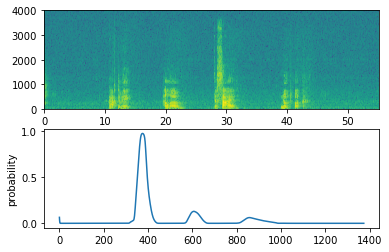

In [56]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

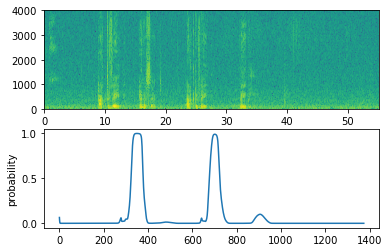

In [57]:
filename  = "./raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

# Congratulations 

You've come to the end of this assignment! 

Here's what you should remember:
- Data synthesis is an effective way to create a large training set for speech problems, specifically trigger word detection. 
- Using a spectrogram and optionally a 1D conv layer is a common pre-processing step prior to passing audio data to an RNN, GRU or LSTM.
- An end-to-end deep learning approach can be used to built a very effective trigger word detection system. 

*Congratulations* on finishing the fimal assignment! 

Thank you for sticking with us through the end and for all the hard work you've put into learning deep learning. We hope you have enjoyed the course! 


# 4 - Try your own example! (OPTIONAL/UNGRADED)

In this optional and ungraded portion of this notebook, you can try your model on your own audio clips! 

Record a 10 second audio clip of you saying the word "activate" and other random words, and upload it to the Coursera hub as `myaudio.wav`. Be sure to upload the audio as a wav file. If your audio is recorded in a different format (such as mp3) there is free software that you can find online for converting it to wav. If your audio recording is not 10 seconds, the code below will either trim or pad it as needed to make it 10 seconds. 


In [ ]:
# Preprocess the audio to the correct format
def preprocess_audio(filename):
    # Trim or pad audio segment to 10000ms
    padding = AudioSegment.silent(duration=10000)
    segment = AudioSegment.from_wav(filename)[:10000]
    segment = padding.overlay(segment)
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

Once you've uploaded your audio file to Coursera, put the path to your file in the variable below.

In [ ]:
your_filename = "audio_examples/my_audio.wav"

In [ ]:
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

Finally, use the model to predict when you say activate in the 10 second audio clip, and trigger a chime. If beeps are not being added appropriately, try to adjust the chime_threshold.

In [ ]:
chime_threshold = 0.5
prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")